# Report

---

Group name: Gruppe B Raghid Allaham & Niels-Janos Simmet

---


## Introduction

Over the last couple of years American Football gained a lot of popularity in Europe especially Germany. Different than soccer, American football is a play based game. After each play the game gets interupted for the offense and defense to set up their team once again. The goal is to achieve a touchdown on the opponents endzone. To achieve that the offense works its way across the field play by play. With each play the offense tries to gain as many yards as possible while the defense tries to prevent this. There are 2 main kind of plays to gain yards: rushing and passing. For a rush plays the offensive team tries to gain yards by caring the ball. For pass plays the quarterback of the offensive team will throw to ball to another player. The key difference is the that for rushing plays the ball will not be airborn but handed over. 

*We want to find out if there is a way to predict how many yards a team will gain in a play based on variables that we know before the play starts.*

Other people have already researched similiar questions but i.e. focused on predicting the rushing yards. We focus on yards generally gained no matter if rushed or passed, as this can not be determined before the play starts. Interesting links to check out for similiar analysis:

http://cs229.stanford.edu/proj2019aut/data/assignment_308832_raw/26588266.pdf

https://rpubs.com/woutcault/Final606_Multiple_Regression

https://medium.com/@matthewdmeans/predicting-yards-gained-in-the-nfl-3a0eea7a54a3

### Data Description

For NFL matches there is a comprehensive data asset available that includes play-by-play data, we will focus on the data gathered so far (until 26th December 2022) in the 2022 NFL season. It tracks a multitude of variables for each play. For our analysis we will focus on the variables that are known before the play starts as explanatory variables and the yards gained as the response variable.
The data was scraped from the NFL Next Gen Stats website with the NFL verse package.

Data Source https://github.com/nflverse/nflverse-data/releases/tag/pbp

Data Description https://mrcaseb.github.io/pages_dummy/reference/fast_scraper.html

Our response variable will be "yards-gained" this variable describes how many yards a team gained (or lost) in a play excluding yards gained via fumble recoveries and laterals.
Our possible explanatory variables can be found in the data dictionary below.



#### Data Dictionary

In [6]:
#Import libraries
import pandas as pd
import data_dic 

#Create Data Frame
data_dictionary_content = data_dic.data_dictionary_content
data_dictionary = pd.DataFrame(data_dictionary_content)
data_dictionary

,Name,Description,Role,Type,Format
0,yards_gained,Yards gained/lost in the play excluding yards ...,Response,numeric,float64
1,quarter_seconds_remaining,Seconds on the clock until the quarter ends,Predictor,numeric,int64
2,qtr,Current quater 1-4 and 5 for overtime,Predictor,numeric,int64
3,down,Current down,Predictor,numeric,float64
4,yardline_100,Distance to the opponents endzone in yards,Predictor,numeric,float64
5,ydstogo,Yards to the next first down,Predictor,numeric,int64
6,score_differential,Score difference between offense team and the ...,Predictor,numeric,float64
7,posteam,Offense Team,Predictor,nominal,object
8,defteam,Defense Team,Predictor,nominal,object
9,home_team,Home Team,Predictor,nominal,object


## Data Setup

In [ ]:
#Import libraries
import altair as alt
import numpy as np
import matplotlib.pyplot as plt
import time
import datetime
import pickle
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LassoCV
import warnings

warnings.filterwarnings('ignore')
alt.data_transformers.disable_max_rows()
pd.set_option('display.max_rows', 500)

### Import data

We import the complete data set which also includes variables which can only be gathered after the play i.e. if a rush or a pass play was tried.

In [ ]:
# Loading Data
path = "..\\data\\raw\\play_by_play_2022.csv"
df = pd.read_csv(path, low_memory=False)

### Data corrections

As we want to find out if there is a way to predict how many yards a team will gain based on variables that we know before the play starts, we reduce the variables to the following small list which represents the variables, that are already known before a play. We also drop all plays during which one of the variables is not available. 

In [ ]:
# Select the relevant variables
column_selection = [
"yards_gained",
"home_team",
"away_team",
"quarter_seconds_remaining",
"qtr",
"down",
"yardline_100",
"ydstogo",
"posteam",
"defteam",
"score_differential"
]
# Filter dataframe for relevant variables
df_small = df[column_selection]
# drop rows with missing values
df_small.dropna(inplace=True)
# Save dataframe as csv
df_small.to_csv("data\\processed\\data_corrected.csv")

### Data structure

In [ ]:
df_small.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35058 entries, 2 to 42322
Data columns (total 11 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   yards_gained               35058 non-null  float64
 1   home_team                  35058 non-null  object 
 2   away_team                  35058 non-null  object 
 3   quarter_seconds_remaining  35058 non-null  int64  
 4   qtr                        35058 non-null  int64  
 5   down                       35058 non-null  float64
 6   yardline_100               35058 non-null  float64
 7   ydstogo                    35058 non-null  int64  
 8   posteam                    35058 non-null  object 
 9   defteam                    35058 non-null  object 
 10  score_differential         35058 non-null  float64
dtypes: float64(4), int64(3), object(4)
memory usage: 3.2+ MB


### Variable lists

We differentiate between categorial variables and numerical variables.

In [ ]:
# List of categorial predictive variables
list_categorial = [
"posteam",
"defteam",
"home_team",
"away_team"
]
# List of our numeric predictive variables
list_numeric = [
"quarter_seconds_remaining",
"qtr",
"down",
"yardline_100",
"ydstogo",
"score_differential"
]

### Data preparation 

Next we split our data into explanatory variables and the response variables.

In [ ]:
# define outcome variable as y_label
y_label = 'yards_gained'
# select features and drop y-variable
X = df_small.drop(['yards_gained'], axis=1)
# create response
y = df_small[y_label]

For the categorial variables we need to create dummy columns to fit them into our regression models.

In [ ]:
# Data correction for the categorial variables
X[list_categorial] = X[list_categorial].astype("category",copy=False)
# Create dummies for the categorial variables, so we can fit them in our model
dummies = pd.get_dummies(X[list_categorial])
# convert the headers to lower_case
dummies.columns = [x.lower() for x in dummies.columns]
# concatenate the categorial variables to the numerics and get all predictive variables in X.
X = pd.concat([X[list_numeric], dummies], axis=1)

### Data splitting
We do a train/test split with 70/30 % of the data.

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, shuffle=True, random_state = 44)

## Analysis

### Descriptive statistics

In [ ]:
# Summary statistics
print(df_small.mean())
df_small.describe().T

yards_gained                   4.668435
quarter_seconds_remaining    424.119516
qtr                            2.574391
down                           1.997005
yardline_100                  51.043585
ydstogo                        8.464231
score_differential            -1.414114
dtype: float64


,count,mean,std,min,25%,50%,75%,max
yards_gained,35058.0,4.668435,8.131966,-26.0,0.0,2.0,7.0,98.0
quarter_seconds_remaining,35058.0,424.119516,272.601532,0.0,174.0,413.0,659.0,900.0
qtr,35058.0,2.574391,1.135944,1.0,2.0,3.0,4.0,5.0
down,35058.0,1.997005,1.003640,1.0,1.0,2.0,3.0,4.0
yardline_100,35058.0,51.043585,24.274817,1.0,32.0,55.0,71.0,99.0
ydstogo,35058.0,8.464231,4.081100,1.0,6.0,10.0,10.0,38.0
score_differential,35058.0,-1.414114,9.296843,-37.0,-7.0,0.0,3.0,37.0


we have 35058 observations (individual plays)

- We notice that the mean of yards gained after each play is about 4.6 with standard deviation of 8.1
- The rest of the data only reflects the rules and characteristics of the game.

### Exploratory data analysis

In [ ]:
# Histogram occurency of Yards gained
df_tmp = pd.DataFrame(df_small).copy()
alt.Chart(df_tmp).mark_bar().encode(
    x=alt.X("yards_gained"),
    y=alt.Y('count()'),
).interactive()

alt.Chart(...)

We can see that many plays result in zero yards gained. This is due to plays being aborted i.e. by incomplete passes or fouls.

In [ ]:
# Histogram occurency of Yards gained without plays were no yards were gained/lost
df_tmp=df_small.loc[df.yards_gained != 0]
alt.Chart(df_tmp).mark_bar().encode(
    x=alt.X("yards_gained"),
    y=alt.Y('count()'),
).interactive()

alt.Chart(...)

After filtering out the plays that result zero yards gained, we get a distribution, that looks like a positive skewed normal distribution, with a mean = 4.6.

In [ ]:
# Calculation of probability that a team gains yards with a play
print("Probability that a team gains positive yards with a play: " + str(round((len(df_small.loc[df_small.yards_gained > 0])  / len(df_small)) * 100, 2) ))

Probability that a team gains positive yards with a play: 57.94


Probability that a team gains positive yards with a play is 57.94 %

### Relationships
Now we want to understand the relationship between our numerical variables.

In [ ]:
# Explorative analysis of correlation between the variables
alt.Chart(df_tmp).mark_circle().encode(
    x=alt.X(alt.repeat("column"), 
            type='quantitative',
            scale=alt.Scale(zero=False)
            ),
    y=alt.Y(alt.repeat("row"), 
            type='quantitative',
            scale=alt.Scale(zero=False)
             )
).properties(
    width=150,
    height=150
).repeat(
    row = list_numeric + ["yards_gained"],
    column=list_numeric + ["yards_gained"]
)

alt.RepeatChart(...)

Some relationships in the data can already be seen, most of them are game roles and restriction related i.e.
- the maximum yards that can be gained are to the finish line, therefor there is a hard cut off and *yards_gained* can never be bigger than *yardline_100*
- a high *score_differntial* is uncommon therefor some relationships look like a normal distribution i.e. *yards_gained* & *score_differential* this is probably due to the fact, that high yard gains are uncommon as well as high score differences, therefor this situations don't occure often
- the *score_differential* becomes wider with every quarter, which makes sense, as the dominant team has more time to score points
- the 5th *qtr* is overtime and therefor shorter, which also leaves less occassions for potential high yard plays. As can be seen the *yards_gained* and *qtr* relationship
- it seems in the 4th *down* there are less *yards_gained* then in the others. Which can be explained by team going for a kick in the 4th down to put the ball deep into the opponents half but does not gain any yards.

#### Correlation Matrix

With a correlation matrix we want to test which of our variables correlate to each other by what amount. For that we chose the Spearman Method over the Pearson and Kendall Method. It does not really on normality of the data as the Pearson method does. And tests for correlation not dependence as the Kendall Method does

In [ ]:
# Correlation Matrix: Spearman Method
corr = df_tmp[list_numeric + ["yards_gained"]].corr(method="spearman").round(2)
corr = corr.style.background_gradient(cmap='twilight_shifted',axis=None)
corr

,quarter_seconds_remaining,qtr,down,yardline_100,ydstogo,score_differential,yards_gained
quarter_seconds_remaining,1.000000,-0.040000,-0.030000,0.080000,-0.000000,0.010000,0.010000
qtr,-0.040000,1.000000,0.020000,-0.040000,0.000000,-0.030000,-0.020000
down,-0.030000,0.020000,1.000000,-0.080000,-0.460000,-0.010000,0.050000
yardline_100,0.080000,-0.040000,-0.080000,1.000000,0.220000,-0.010000,0.090000
ydstogo,-0.000000,0.000000,-0.460000,0.220000,1.000000,-0.000000,0.090000
score_differential,0.010000,-0.030000,-0.010000,-0.010000,-0.000000,1.000000,-0.070000
yards_gained,0.010000,-0.020000,0.050000,0.090000,0.090000,-0.070000,1.000000


We can see a that most of the variables do not strongly correlate with each other.

*ydstogo* and *down* are quite strongly correlated as expected, because with each down the offensive team should come closer to the yardline it needs to reach.

*ydstogo* and *yardline_100* also have some correlation which can be explained by the underlying rules of the game. The offensive team can not have more yards to go than they have until they enter the defenses endzone, the distance to which is represented by the *yardline_100* variable. Therefor it's always *ydstogo* <= *yardline_100*

*yards_gained* and *down* also seem to have a correlation which can be explained by 
- the offensive team rather punting (kicking the ball to the direction of the defenses endzone which usually allows the defense to become offense) than trying to gain yards on 4th down
- game tactics as the target distance *ydstogo* correlates with *down*. Teams might more often go for plays that result in just making it to the yardline on 3rd or 4th down rather than aiming for big plays that result in many yards gained.

## Modeling
In this section we will look at 3 different regression models (Linear regression, K-nearest neighbour, & Lasso-regression) as well as Model 4 were we just always predict the mean value as a sanity check.

### Model 1: Linear regression model

In [ ]:
# Select a linear regression model
reg = LinearRegression()
X.head()

,quarter_seconds_remaining,qtr,down,yardline_100,ydstogo,score_differential,posteam_ari,posteam_atl,posteam_bal,posteam_buf,...,away_team_no,away_team_nyg,away_team_nyj,away_team_phi,away_team_pit,away_team_sea,away_team_sf,away_team_tb,away_team_ten,away_team_was
2,896,1,1.0,78.0,10,0.0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,869,1,1.0,59.0,10,0.0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,865,1,2.0,59.0,10,0.0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,841,1,3.0,54.0,5,0.0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,833,1,4.0,64.0,15,0.0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


#### Forward selection
Because we have a lot a variables, we would like to choose the 10 most relevant variables for the model to make it more sensitive in regards to these important variables.
Doing so, we use Forward selection:

In [ ]:
sfs_backward = SequentialFeatureSelector(
    reg, n_features_to_select=10, cv=5, direction="forward"
).fit(X_train, y_train)

In [ ]:
# We redefine our predictive data and select only the relevant 10 variables
X.columns[sfs_backward.get_support()]
relevant_features = X.columns[sfs_backward.get_support()]
X_train = X_train[relevant_features]
X_test = X_test[relevant_features]

In [ ]:
# Fit the model
reg.fit(X_train, y_train)

LinearRegression()

After the model training we can check the 10 most important variables and their coefficient.

In [ ]:
intercept = pd.DataFrame({
    "Name": ["Intercept"],
    "Coefficient":[reg.intercept_]}
    )
slope = pd.DataFrame({
    "Name": relevant_features,
    "Coefficient": reg.coef_}
)
table = pd.concat([intercept, slope], ignore_index=True, sort=False)
round(table, 3)

,Name,Coefficient
0,Intercept,4.661
1,down,-0.896
2,yardline_100,0.031
3,score_differential,-0.028
4,posteam_buf,0.945
5,posteam_kc,1.244
6,posteam_mia,1.070
7,posteam_phi,0.914
8,posteam_sf,0.890
9,home_team_den,-1.026


#### Evaluation on Test set

In [ ]:
# Prediction for our data
y_pred = reg.predict(X_test)

In [ ]:
# Mean squared error model 1
model1MSE = mean_squared_error(y_test, y_pred)
model1MSE

63.43250919198005

In [ ]:
# Root mean squared error model 1
model1RMSE = mean_squared_error(y_test, y_pred, squared=False)
model1RMSE

7.9644528495044815

In [ ]:
# Mean absolute error model 1
model1MAE = mean_absolute_error(y_test, y_pred)
model1MAE

5.307034643163722

#### Save Model

In [ ]:
ts = time.time()
file = '../models/linear_reg_model.sav' + datetime.datetime.fromtimestamp(ts).strftime('_%Y-%m-%d-%H_%M_%S') + ".sav"
# pickle.dump(reg, open(file, 'wb')) # uncommented to reduce dumping models, after each reload. 
file

'../models/linear_reg_model.sav_2023-01-16-21_38_42.sav'

### Model 2: K-Nearest Neighbor Model

In [ ]:
reg2 = KNeighborsRegressor(n_neighbors=2)
reg2.fit(X_train, y_train)

KNeighborsRegressor(n_neighbors=2)

#### Evaluation on Test set

In [ ]:
y_pred2 = reg2.predict(X_test)

In [ ]:
# Mean squared error model 2
model2MSE = mean_squared_error(y_test, y_pred2)
model2MSE

86.06705172085948

In [ ]:
# Root mean squared error model 2
model2RMSE = mean_squared_error(y_test, y_pred2, squared=False)
model2RMSE

9.277232977610268

In [ ]:
# Mean absolute error model 2
model2MAE = mean_absolute_error(y_test, y_pred2)
model2MAE

6.069832667807568

#### Save Model

In [ ]:
ts = time.time()
file = '../models/KN_Model.sav' + datetime.datetime.fromtimestamp(ts).strftime('_%Y-%m-%d-%H_%M_%S') + ".sav"
# pickle.dump(reg2, open(file, 'wb')) # uncommented to reduce dumping models, after each reload. 
file

'../models/KN_Model.sav_2023-01-16-21_38_43.sav'

### Model 3: Lasso Regression

#### Standardization

- Lasso performs best when all numerical features are centered around 0 and have variance in the same order. 
- If a feature has a variance that is orders of magnitude larger than others, it might dominate the objective function and make the estimator unable to learn from other features correctly as expected.
- This means it is important to standardize our features. 

$$z = \frac{(x- \bar x)}{s}$$

In [ ]:
scaler = StandardScaler().fit(X_train) 
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
# numpy.linspace(start, stop, num of samples)
alphas = np.linspace(0.01,500,100)
lasso = Lasso(max_iter=10000)
coefs = []
for a in alphas:
    lasso.set_params(alpha=a)
    lasso.fit(X_train, y_train)
    coefs.append(lasso.coef_)

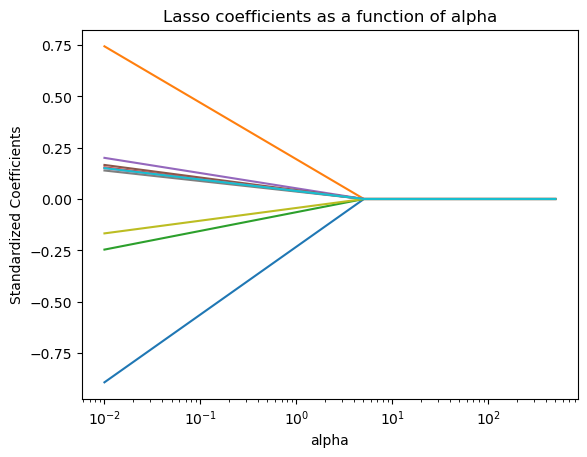

In [ ]:
ax = plt.gca()
ax.plot(alphas, coefs)
ax.set_xscale('log')
plt.axis('tight')
plt.xlabel('alpha')
plt.ylabel('Standardized Coefficients')
plt.title('Lasso coefficients as a function of alpha');

#### Lasso with optimal alpha

- To find the optimal value of alpha, we use scikit learns lasso linear model with iterative fitting along a regularization path ([LassoCV](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LassoCV.html)). 

- The best model is selected by cross-validation.

##### k-fold cross validation

In [ ]:
# Lasso with 5 fold cross-validation
reg = LassoCV(cv=5, random_state=0, max_iter=10000)
reg.fit(X_train, y_train)

LassoCV(cv=5, max_iter=10000, random_state=0)

In [ ]:
# Show best value of penalization chosen by cross validation:
reg.alpha_

0.0009685368136113017

In [ ]:
# Set best alpha
lasso_best = Lasso(alpha=reg.alpha_)
lasso_best.fit(X_train, y_train)

Lasso(alpha=0.0009685368136113017)

#### Evaluation on Test set

In [ ]:
# Show score
print('R squared training set', round(lasso_best.score(X_train, y_train)*100, 2))
print('R squared test set', round(lasso_best.score(X_test, y_test)*100, 2))

R squared training set 2.55
R squared test set 2.28


In [ ]:
# Mean squared error model 3
model3MSE = mean_squared_error(y_test, lasso_best.predict(X_test))
model3MSE

63.43151846072908

In [ ]:
# Root mean squared error model 3
model3RMSE = mean_squared_error(y_test, lasso_best.predict(X_test), squared=False)
model3RMSE

7.964390652192362

In [ ]:
# Mean absolute error model 3
model3MAE = mean_absolute_error(y_test, lasso_best.predict(X_test))
model3MAE

5.307091618975074

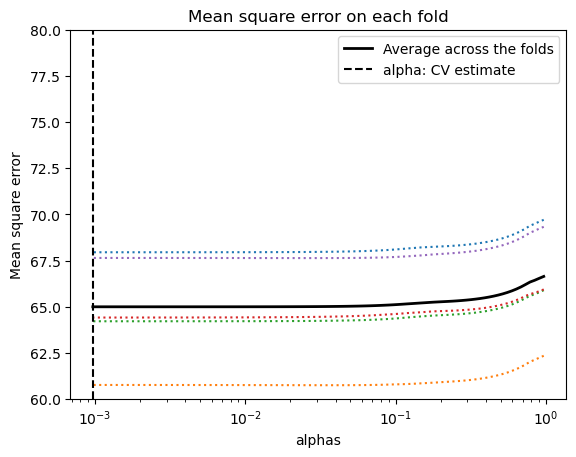

In [ ]:
plt.semilogx(reg.alphas_, reg.mse_path_, ":")
plt.plot(
    reg.alphas_ ,
    reg.mse_path_.mean(axis=-1),
    "k",
    label="Average across the folds",
    linewidth=2,
)
plt.axvline(
    reg.alpha_, linestyle="--", color="k", label="alpha: CV estimate"
)
plt.legend()
plt.xlabel("alphas")
plt.ylabel("Mean square error")
plt.title("Mean square error on each fold")
plt.axis("tight")
ymin, ymax = 60, 80
plt.ylim(ymin, ymax);

In [ ]:
# saving the lasso reg model
ts = time.time()
file = '../models/lasso_reg_model.sav' + datetime.datetime.fromtimestamp(ts).strftime('_%Y-%m-%d-%H_%M_%S') + ".sav"
# pickle.dump(lasso_best, open(file, 'wb')) # uncommented to reduce dumping models, after each reload. 
file

'../models/lasso_reg_model.sav_2023-01-16-21_38_47.sav'

### "Model 4": Always predict the mean value

In [ ]:
y_prediction_model4 = np.full(len(y_test),y_train.mean())
y_prediction_model4

array([4.65334148, 4.65334148, 4.65334148, ..., 4.65334148, 4.65334148,
       4.65334148])

In [ ]:
# Mean squared error model 4
model4MSE = mean_squared_error(y_test, y_prediction_model4)
model4MSE

64.91328211074314

In [ ]:
# Root mean squared error model 4
model4RMSE = mean_squared_error(y_test, y_prediction_model4, squared=False)
model4RMSE

8.056877938180715

In [ ]:
# Mean absolute error model 4
model4MAE = mean_absolute_error(y_test, y_prediction_model4)
model4MAE

5.451782561442774

## Conclusions

Out of the 3 Models we evaluated only Linear regression and Lasso regression were able to beat our naive Model where we always predicted the mean value of the training set slightly.

Both Linear Regression and Lasso Regression performed essentially the same and only slightly better than the Dummy Model.

It seems that with the given variables we were not able to create a model which can predict yards gained in a football game reliable. This reflects the unpredictable nature of the game, which makes it enjoyable by millions of fans.

In [ ]:
comparison_models_content = {
    "Model":[
        "Linear Regression",
        "K-nearest neighbour",
        "Lasso Regression",
        "Mean Value Model",
    ],
    "MSE":[
        model1MSE,
        model2MSE,
        model3MSE,
        model4MSE
    ],
    "RMSE":[
        model1RMSE,
        model2RMSE,
        model3RMSE,
        model4RMSE
    ],
    "MAE":[
        model1MAE,
        model2MAE,
        model3MAE,
        model4MAE
    ]
}
comparison_models = pd.DataFrame(comparison_models_content)
comparison_models

,Model,MSE,RMSE,MAE
0,Linear Regression,63.432509,7.964453,5.307035
1,K-nearest neighbour,86.067052,9.277233,6.069833
2,Lasso Regression,63.431518,7.964391,5.307092
3,Mean Value Model,64.913282,8.056878,5.451783


In [ ]:
alt.Chart(comparison_models).mark_bar().encode(
    x=alt.X("MSE"),
    y=alt.Y('Model'),
    color = 'Model'
).interactive() & alt.Chart(comparison_models).mark_bar().encode(
    x=alt.X("RMSE"),
    y=alt.Y('Model'),
    color = 'Model'
).interactive() & alt.Chart(comparison_models).mark_bar().encode(
    x=alt.X("MAE"),
    y=alt.Y('Model'),
    color = 'Model'
)  

alt.VConcatChart(...)